In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/0f72db9c-d635-4415-9781-68937328aed2___NREC_B.Spot 9188.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/1b8d3e98-43d9-441d-93ef-a359e6e9ddc2___NREC_B.Spot 9052.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/b6d35d21-4812-4e32-ab9a-b6ddda8cbb79___JR_B.Spot 8972.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/e4e7e5a2-5aa1-4378-833d-9142358c7c9b___JR_B.Spot 9092.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/8b50f2db-cbf2-4758-bea6-a011f0cc1497___JR_B.Spot 3235.JPG
/kaggle/input/plant-village-dataset/PlantVillageDataset/PlantVillage/PlantVillage/Pepper__bell___Bacterial_spot/729b55d7-2a99-4861-910d-3b4e2bbce1

In [9]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, Sequential
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.callbacks import EarlyStopping,ModelCheckpoint
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from tensorflow.keras.applications import Xception
from tensorflow.keras import layers, models

In [10]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        for image_filename in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_filename)
            images.append(image_path)
            labels.append(subfolder)
    return pd.DataFrame({'image': images, 'label': labels})

In [11]:
dataset_path = '/kaggle/input/plantvillage-dataset/color'
data_df = data(dataset_path)

In [5]:
data_df

,image,label
0,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
1,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
2,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
3,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
4,/kaggle/input/plantvillage-dataset/color/Tomat...,Tomato___Late_blight
...,...,...
54300,/kaggle/input/plantvillage-dataset/color/Corn_...,Corn_(maize)___healthy
54301,/kaggle/input/plantvillage-dataset/color/Corn_...,Corn_(maize)___healthy
54302,/kaggle/input/plantvillage-dataset/color/Corn_...,Corn_(maize)___healthy
54303,/kaggle/input/plantvillage-dataset/color/Corn_...,Corn_(maize)___healthy


In [12]:
X_train, X_test1, y_train, y_test1 = train_test_split(
    data_df['image'], data_df['label'], test_size=0.2, random_state=42, stratify=data_df['label']
)
X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.5, random_state=42, stratify=y_test1
)


In [22]:
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})


In [23]:
df_train['label'] = pd.Categorical(df_train['label']).codes
df_val['label'] = pd.Categorical(df_val['label']).codes
df_test['label'] = pd.Categorical(df_test['label']).codes
# Encode labels to strings for compatibility with class_mode='categorical'
df_train['label'] = pd.Categorical(df_train['label']).categories[df_train['label']].astype(str)
df_val['label'] = pd.Categorical(df_val['label']).categories[df_val['label']].astype(str)
df_test['label'] = pd.Categorical(df_test['label']).categories[df_test['label']].astype(str)

In [13]:
image_size = (224, 224)
batch_size = 32

In [24]:
datagen = ImageDataGenerator(rescale=1./255)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True
)

In [25]:
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

Found 43444 validated image filenames belonging to 38 classes.
Found 5430 validated image filenames belonging to 38 classes.
Found 5431 validated image filenames belonging to 38 classes.


In [26]:
df_train.label.value_counts().to_frame()

,count
label,
15,4405
35,4286
24,4072
16,1837
28,1702
30,1527
25,1468
32,1417
33,1341


In [35]:
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False


In [36]:
num_classes = len(train_generator.class_indices)
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  
    layers.Dense(1024, activation='relu'),
    layers.Dense(num_classes, activation='softmax')  
])

In [37]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC()]
)

In [38]:
with tf.device('/GPU:0'):
    history = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    )

Epoch 1/10
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 376s 272ms/step - accuracy: 0.7830 - auc_1: 0.9820 - loss: 0.7578 - val_accuracy: 0.8781 - val_auc_1: 0.9956 - val_loss: 0.3583
Epoch 2/10
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 216s 159ms/step - accuracy: 0.9137 - auc_1: 0.9975 - loss: 0.2607 - val_accuracy: 0.9105 - val_auc_1: 0.9957 - val_loss: 0.2830
Epoch 3/10
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 216s 159ms/step - accuracy: 0.9294 - auc_1: 0.9981 - loss: 0.2027 - val_accuracy: 0.9147 - val_auc_1: 0.9965 - val_loss: 0.2558
Epoch 4/10
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 216s 159ms/step - accuracy: 0.9425 - auc_1: 0.9984 - loss: 0.1660 - val_accuracy: 0.8974 - val_auc_1: 0.9930 - val_loss: 0.3330
Epoch 5/10
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 216s 159ms/step - accuracy: 0.9523 - auc_1: 0.9988 - loss: 0.1372 - val_accuracy: 0.9258 - val_auc_1: 0.9954 - val_loss: 0.2391
Epoch 6/10
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 216s 159ms/step - accuracy: 0.9548 - auc_1: 0.9989 - loss: 0.1263 - val_accuracy: 0.9311 - val_auc_1: 0.9956

In [39]:
hist_=pd.DataFrame(history.history)
hist_

,accuracy,auc_1,loss,val_accuracy,val_auc_1,val_loss
0,0.853259,0.993844,0.475954,0.878085,0.995629,0.358334
1,0.915592,0.997433,0.253385,0.910497,0.995681,0.282988
2,0.932189,0.997941,0.198924,0.914733,0.996498,0.255823
3,0.941327,0.998244,0.169507,0.897422,0.993025,0.333010
4,0.950511,0.998592,0.144757,0.925783,0.995370,0.239080
5,0.953549,0.998699,0.131062,0.931123,0.995640,0.221340
6,0.960248,0.998811,0.113630,0.940884,0.996130,0.189314
7,0.963056,0.998775,0.106222,0.938490,0.995793,0.208632
8,0.967752,0.999073,0.093558,0.938858,0.995673,0.197014
9,0.969087,0.999048,0.089865,0.939595,0.995478,0.204339


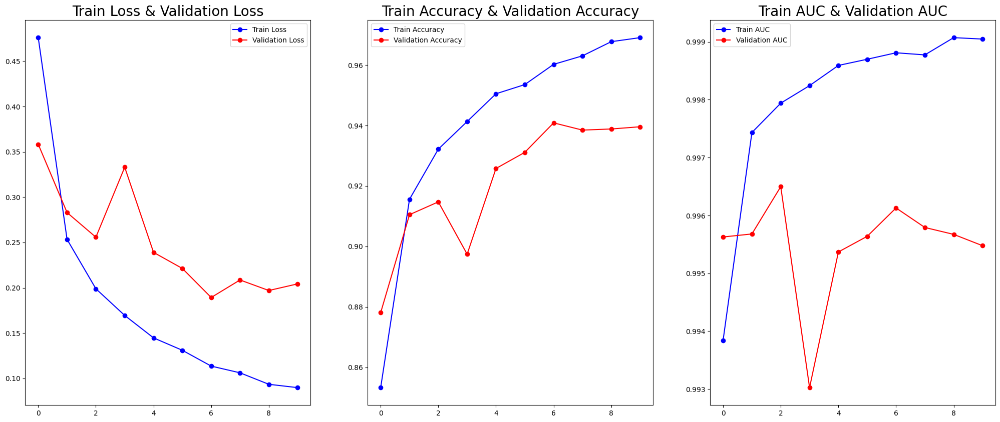

In [41]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 3, 1)
plt.plot(hist_['loss'], 'b-o', label='Train Loss')
plt.plot(hist_['val_loss'], 'r-o', label='Validation Loss')
plt.title('Train Loss & Validation Loss', fontsize=20)
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(hist_['accuracy'], 'b-o', label='Train Accuracy')
plt.plot(hist_['val_accuracy'], 'r-o', label='Validation Accuracy')
plt.title('Train Accuracy & Validation Accuracy', fontsize=20)
plt.legend()

if 'auc_1' in hist_.columns and 'val_auc_1' in hist_.columns:
    plt.subplot(1, 3, 3)
    plt.plot(hist_['auc_1'], 'b-o', label='Train AUC')
    plt.plot(hist_['val_auc_1'], 'r-o', label='Validation AUC')
    plt.title('Train AUC & Validation AUC', fontsize=20)
    plt.legend()

plt.show()


In [42]:
# After training, evaluate the model on the test data
test_loss, test_accuracy, test_auc = model.evaluate(test_generator)

# Print the test results
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")
print(f"Test AUC: {test_auc}")


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


170/170 ━━━━━━━━━━━━━━━━━━━━ 54s 319ms/step - accuracy: 0.9306 - auc_1: 0.9953 - loss: 0.2250
Test Loss: 0.2070748507976532
Test Accuracy: 0.9399742484092712
Test AUC: 0.9951967000961304


170/170 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step
F1 Score (Micro Average): 0.9400


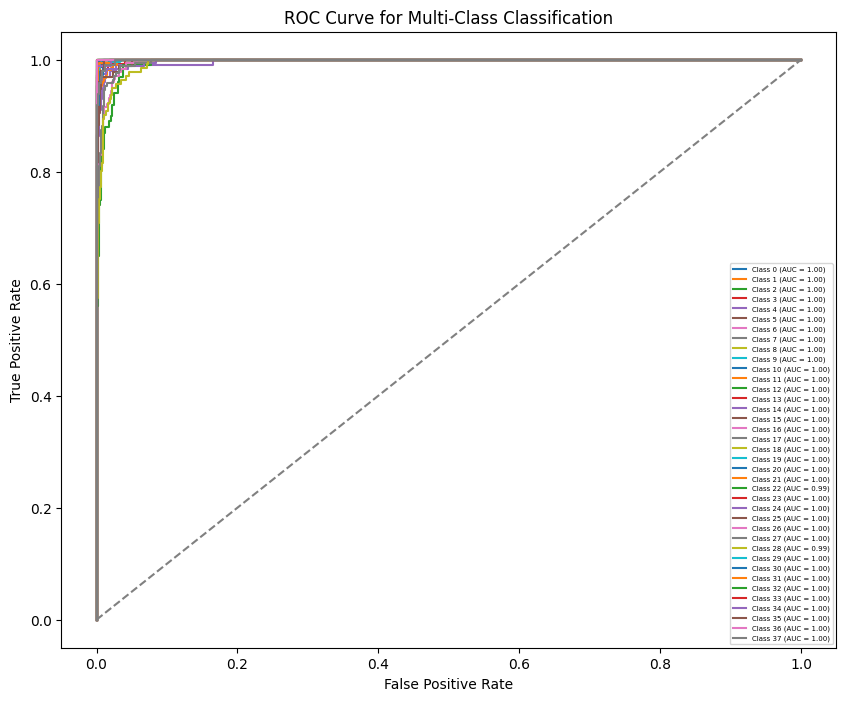


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.78      0.87        63
           1       0.86      1.00      0.93        62
          10       0.99      1.00      1.00       116
          11       0.94      0.85      0.89       118
          12       0.86      0.99      0.92       139
          13       0.86      1.00      0.93       108
          14       1.00      0.83      0.91        42
          15       0.99      1.00      0.99       551
          16       0.98      1.00      0.99       230
          17       0.94      0.94      0.94        36
          18       0.97      0.88      0.92        99
          19       0.95      0.96      0.96       148
           2       0.96      0.96      0.96        27
          20       1.00      0.87      0.93       100
          21       0.88      0.90      0.89       100
          22       0.76      0.87      0.81        15
          23       0.95      0.97      0.96        37
   

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import roc_curve, auc, f1_score, classification_report
from sklearn.preprocessing import label_binarize

# Get true labels and predicted probabilities
y_true = test_generator.classes  # True class indices
y_pred = model.predict(test_generator)  # Predicted probabilities

# For multi-class classification, convert true labels to one-hot encoding
y_true_one_hot = label_binarize(y_true, classes=np.arange(len(test_generator.class_indices)))

# Calculate F1 Score (micro average for multi-class)
y_pred_classes = np.argmax(y_pred, axis=1)  # Predicted class indices
f1 = f1_score(y_true, y_pred_classes, average='micro')  # Micro average F1 score
print(f"F1 Score (Micro Average): {f1:.4f}")

# ROC Curve for multi-class classification (one-vs-rest)
fpr, tpr, roc_auc = {}, {}, {}
for i in range(len(test_generator.class_indices)):
    fpr[i], tpr[i], _ = roc_curve(y_true_one_hot[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure(figsize=(10, 8))
for i in range(len(test_generator.class_indices)):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot the diagonal (random classifier)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.title('ROC Curve for Multi-Class Classification')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(fontsize=5)
plt.show()

# Print Classification Report with Precision, Recall, and F1 Score for each class
print("\nClassification Report:")
report = classification_report(y_true, y_pred_classes, target_names=list(test_generator.class_indices.keys()))
print(report)


In [82]:
CM = confusion_matrix(y_test,y_pred)
plt.figure(figsize=(15,25))
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Set2',xticklabels=class_,yticklabels=class_)
CM

ValueError: Classification metrics can't handle a mix of multiclass and continuous-multioutput targets

170/170 ━━━━━━━━━━━━━━━━━━━━ 14s 81ms/step


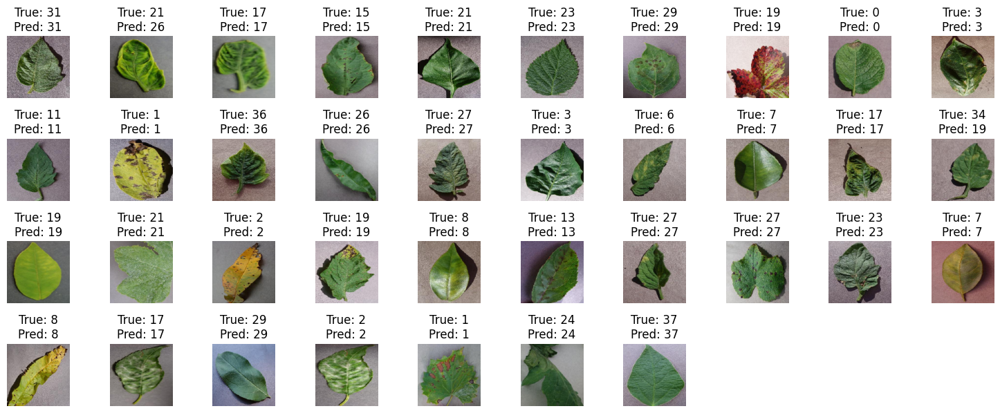

In [83]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class indices mapping
class_indices = {v: k for k, v in test_generator.class_indices.items()}  # Reverse the mapping

# Predict on the test set
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Predicted class indices
y_true_classes = test_generator.classes  # True class indices

# Display 9 images with their true and predicted labels
plt.figure(figsize=(15, 15))
for i in range(37):
    # Get a batch of data
    img, label = test_generator[i]
    
    # Select the first image from the batch
    image = img[0]
    true_label = class_indices[y_true_classes[i]]
    pred_label = class_indices[y_pred_classes[i]]

    # Plot the image
    plt.subplot(10, 10, i + 1)
    plt.imshow(image)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()


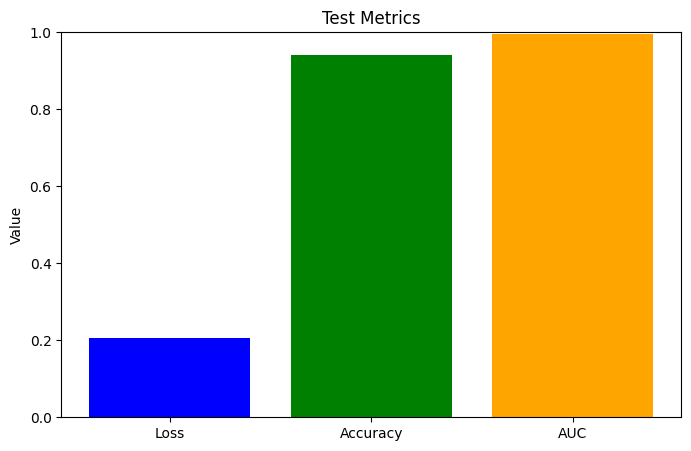

In [44]:
# Visualize test metrics
metrics = ['Loss', 'Accuracy', 'AUC']
values = [test_loss, test_accuracy, test_auc]

plt.figure(figsize=(8, 5))
plt.bar(metrics, values, color=['blue', 'green', 'orange'])
plt.title('Test Metrics')
plt.ylim(0, 1)
plt.ylabel('Value')
plt.show()


In [45]:
base_model.trainable = True

for layer in base_model.layers[:100]: 
    layer.trainable = False
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),  
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC()]
)

history_fine_tune = model.fit(
    train_generator,
    epochs=7,
    validation_data=val_generator
)


Epoch 1/7
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 339s 238ms/step - accuracy: 0.9354 - auc_2: 0.9961 - loss: 0.2107 - val_accuracy: 0.9759 - val_auc_2: 0.9989 - val_loss: 0.0736
Epoch 2/7
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 312s 230ms/step - accuracy: 0.9851 - auc_2: 0.9997 - loss: 0.0421 - val_accuracy: 0.9753 - val_auc_2: 0.9982 - val_loss: 0.0872
Epoch 3/7
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 313s 230ms/step - accuracy: 0.9905 - auc_2: 0.9996 - loss: 0.0289 - val_accuracy: 0.9759 - val_auc_2: 0.9969 - val_loss: 0.0950
Epoch 4/7
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 312s 229ms/step - accuracy: 0.9932 - auc_2: 0.9998 - loss: 0.0210 - val_accuracy: 0.9845 - val_auc_2: 0.9988 - val_loss: 0.0513
Epoch 5/7
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 313s 230ms/step - accuracy: 0.9936 - auc_2: 0.9999 - loss: 0.0184 - val_accuracy: 0.9862 - val_auc_2: 0.9991 - val_loss: 0.0493
Epoch 6/7
1358/1358 ━━━━━━━━━━━━━━━━━━━━ 313s 230ms/step - accuracy: 0.9948 - auc_2: 0.9998 - loss: 0.0155 - val_accuracy: 0.9842 - val_auc_2: 0.9986 - val

In [46]:
hist_fine_tune=pd.DataFrame(history_fine_tune.history)
hist_fine_tune

,accuracy,auc_2,loss,val_accuracy,val_auc_2,val_loss
0,0.959925,0.998422,0.123453,0.975875,0.998914,0.073619
1,0.985453,0.999635,0.042790,0.975322,0.998162,0.087159
2,0.989780,0.999718,0.029905,0.975875,0.996938,0.095019
3,0.992381,0.999758,0.022989,0.984530,0.998761,0.051339
4,0.992634,0.999771,0.021894,0.986188,0.999126,0.049306
5,0.994153,0.999772,0.017525,0.984162,0.998571,0.056752
6,0.995051,0.999809,0.014921,0.986740,0.998384,0.046015


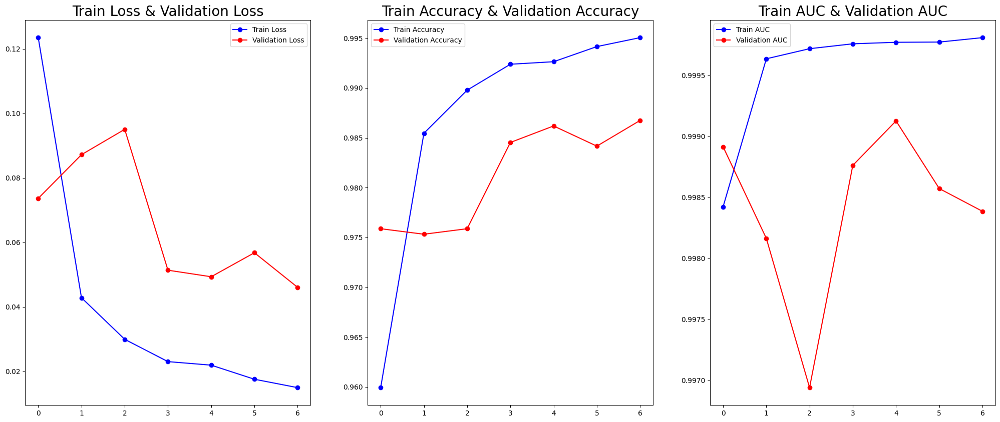

In [48]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 3, 1)
plt.plot(hist_fine_tune['loss'], 'b-o', label='Train Loss')
plt.plot(hist_fine_tune['val_loss'], 'r-o', label='Validation Loss')
plt.title('Train Loss & Validation Loss', fontsize=20)
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(hist_fine_tune['accuracy'], 'b-o', label='Train Accuracy')
plt.plot(hist_fine_tune['val_accuracy'], 'r-o', label='Validation Accuracy')
plt.title('Train Accuracy & Validation Accuracy', fontsize=20)
plt.legend()

if 'auc_2' in hist_fine_tune.columns and 'val_auc_2' in hist_fine_tune.columns:
    plt.subplot(1, 3, 3)
    plt.plot(hist_fine_tune['auc_2'], 'b-o', label='Train AUC')
    plt.plot(hist_fine_tune['val_auc_2'], 'r-o', label='Validation AUC')
    plt.title('Train AUC & Validation AUC', fontsize=20)
    plt.legend()

plt.show()


In [49]:
# After training, evaluate the model on the test data
test_loss, test_accuracy, test_auc = model.evaluate(test_generator)

# Print the test results
print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")
print(f"Test AUC: {test_auc}")


170/170 ━━━━━━━━━━━━━━━━━━━━ 26s 151ms/step - accuracy: 0.9855 - auc_2: 0.9990 - loss: 0.0557
Test Loss: 0.052462201565504074
Test Accuracy: 0.9861903786659241
Test AUC: 0.9988589882850647


170/170 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step


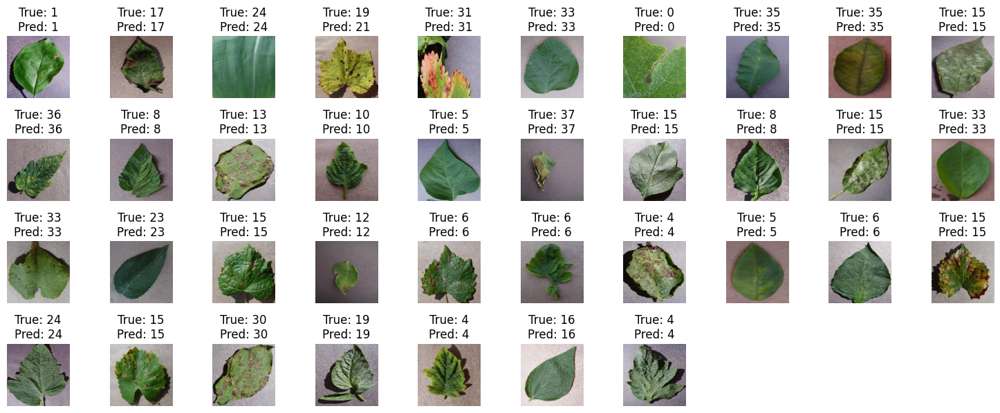

In [50]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class indices mapping
class_indices = {v: k for k, v in test_generator.class_indices.items()}  # Reverse the mapping

# Predict on the test set
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Predicted class indices
y_true_classes = test_generator.classes  # True class indices

# Display 9 images with their true and predicted labels
plt.figure(figsize=(15, 15))
for i in range(37):
    # Get a batch of data
    img, label = test_generator[i]
    
    # Select the first image from the batch
    image = img[0]
    true_label = class_indices[y_true_classes[i]]
    pred_label = class_indices[y_pred_classes[i]]

    # Plot the image
    plt.subplot(10, 10, i + 1)
    plt.imshow(image)
    plt.title(f"True: {true_label}\nPred: {pred_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()
